In [1]:
# importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3


In [2]:
# reading the data which is in sqlite formet
con = sqlite3.connect(r"path\Amazon_database.sqlite")
type(con)

sqlite3.Connection

In [3]:
# converting sql data into dataframe formet

In [4]:
df = pd.read_sql_query("SELECT * FROM Reviews",con) # where Reviews is a table of con database

In [5]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [6]:
df.shape

(568454, 10)

In [7]:
# Sentiment analysis of data
! pip install textblob

from textblob import TextBlob
TextBlob(df["Summary"][0]).sentiment.polarity

0.7

In [8]:
polarity_summary= []
# To remove null values
for i in df["Summary"]:
    try:
         polarity_summary.append(TextBlob(i).sentiment.polarity)
    except:
        polarity_summary.append(0)

In [9]:
polarity_text= []

for i in df["Text"]:
    try:
         polarity_text.append(TextBlob(i).sentiment.polarity)
    except:
        polarity_text.append(0)

In [10]:
data = df.copy()

In [11]:
data["Polarity_Summary"] = polarity_summary
data["Polarity_Text"] =polarity_text

In [12]:
data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Polarity_Summary,Polarity_Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,0.7,0.450000
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0.0,-0.033333
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,0.0,0.133571
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0.0,0.166667
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,0.8,0.483333


In [13]:
# Find Postive and Negative Sentiments

In [14]:
data_Positive = data[(data["Polarity_Summary"]>0) & (data["Polarity_Text"]>0)]
data_Positive.shape

(310806, 12)

In [15]:
data_Negative = data[(data["Polarity_Summary"]<=0) & (data["Polarity_Text"]<=0)]
data_Negative.shape

(45579, 12)

In [16]:
data_Positive.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Polarity_Summary,Polarity_Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,0.700000,0.450000
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,0.800000,0.483333
5,6,B006K2ZZ7K,ADT0SRK1MGOEU,Twoapennything,0,0,4,1342051200,Nice Taffy,I got a wild hair for taffy and ordered this f...,0.600000,0.257407
6,7,B006K2ZZ7K,A1SP2KVKFXXRU1,David C. Sullivan,0,0,5,1340150400,Great! Just as good as the expensive brands!,This saltwater taffy had great flavors and was...,0.358333,0.250833
7,8,B006K2ZZ7K,A3JRGQVEQN31IQ,Pamela G. Williams,0,0,5,1336003200,"Wonderful, tasty taffy",This taffy is so good. It is very soft and ch...,1.000000,0.486000


In [17]:
data_Negative.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Polarity_Summary,Polarity_Text
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0.0,-0.033333
14,15,B001GVISJM,A2MUGFV2TDQ47K,"Lynrie ""Oh HELL no""",4,5,5,1268352000,Strawberry Twizzlers - Yummy,The Strawberry Twizzlers are my guilty pleasur...,0.0,-0.500000
25,26,B001GVISJM,A3FONPR03H3PJS,"Deborah S. Linzer ""Cat Lady""",0,0,5,1288310400,Twizzlers - Strawberry,Product received is as advertised.<br /><br />...,0.0,0.000000
26,27,B001GVISJM,A3RXAU2N8KV45G,lady21,0,1,1,1332633600,Nasty No flavor,"The candy is just red , No flavor . Just plan...",-1.0,0.000000
50,51,B001EO5QW8,A108P30XVUFKXY,Roberto A,0,7,1,1203379200,Don't like it,"This oatmeal is not good. Its mushy, soft, I d...",0.0,-0.125000


In [18]:
# make  wordcloud for postive data 

In [19]:
# get the whole positive summary data 
total_text = " ".join(data_Positive["Summary"])

In [20]:
len( total_text)

7913324

In [21]:
total_text[0:1000]

'Good Quality Dog Food Great taffy Nice Taffy Great!  Just as good as the expensive brands! Wonderful, tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this "diet" food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy! Love it! GREAT SWEET CANDY! Always fresh Delicious product! Great Bargain for the Price The Best Hot Sauce in the World Great machine! Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry! satisfying Love Gluten Free Oatmeal!!! GOOD WAY TO START THE DAY.... Wife\'s favorite Breakfast Why wouldn\'t you buy oatmeal from Mcanns? Tastes great! Good Hot Breakfast Great taste and convenience good Very good but next time I won\'t order the Variety Pack HOT!  And good!  Came back for more  :) Roasts up a smooth brew Our guests love it! Awesome Deal! Awsome - Kids in neighborhood loved us! great deal. Better price for this at Target great source of electrolytes Great for preventing cramps H

In [22]:
# removing everything other than a-z or A-Z using regular expresion
import re 
re.sub("[^a-zA-Z]"," ",total_text)[0:1000]

'Good Quality Dog Food Great taffy Nice Taffy Great   Just as good as the expensive brands  Wonderful  tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this  diet  food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy  Love it  GREAT SWEET CANDY  Always fresh Delicious product  Great Bargain for the Price The Best Hot Sauce in the World Great machine  Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry  satisfying Love Gluten Free Oatmeal    GOOD WAY TO START THE DAY     Wife s favorite Breakfast Why wouldn t you buy oatmeal from Mcanns  Tastes great  Good Hot Breakfast Great taste and convenience good Very good but next time I won t order the Variety Pack HOT   And good   Came back for more     Roasts up a smooth brew Our guests love it  Awesome Deal  Awsome   Kids in neighborhood loved us  great deal  Better price for this at Target great source of electrolytes Great for preventing cramps How 

In [23]:
# Now removing extra spaces 
re.sub( " +"," ",total_text)

'Good Quality Dog Food Great taffy Nice Taffy Great! Just as good as the expensive brands! Wonderful, tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this "diet" food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy! Love it! GREAT SWEET CANDY! Always fresh Delicious product! Great Bargain for the Price The Best Hot Sauce in the World Great machine! Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry! satisfying Love Gluten Free Oatmeal!!! GOOD WAY TO START THE DAY.... Wife\'s favorite Breakfast Why wouldn\'t you buy oatmeal from Mcanns? Tastes great! Good Hot Breakfast Great taste and convenience good Very good but next time I won\'t order the Variety Pack HOT! And good! Came back for more :) Roasts up a smooth brew Our guests love it! Awesome Deal! Awsome - Kids in neighborhood loved us! great deal. Better price for this at Target great source of electrolytes Great for preventing cramps How m

In [24]:
total_text[0:1000]

'Good Quality Dog Food Great taffy Nice Taffy Great!  Just as good as the expensive brands! Wonderful, tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this "diet" food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy! Love it! GREAT SWEET CANDY! Always fresh Delicious product! Great Bargain for the Price The Best Hot Sauce in the World Great machine! Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry! satisfying Love Gluten Free Oatmeal!!! GOOD WAY TO START THE DAY.... Wife\'s favorite Breakfast Why wouldn\'t you buy oatmeal from Mcanns? Tastes great! Good Hot Breakfast Great taste and convenience good Very good but next time I won\'t order the Variety Pack HOT!  And good!  Came back for more  :) Roasts up a smooth brew Our guests love it! Awesome Deal! Awsome - Kids in neighborhood loved us! great deal. Better price for this at Target great source of electrolytes Great for preventing cramps H

In [25]:
! pip install wordcloud

In [26]:
from wordcloud import WordCloud,STOPWORDS

In [27]:
stopwords = set(STOPWORDS)

(-0.5, 999.5, 499.5, -0.5)

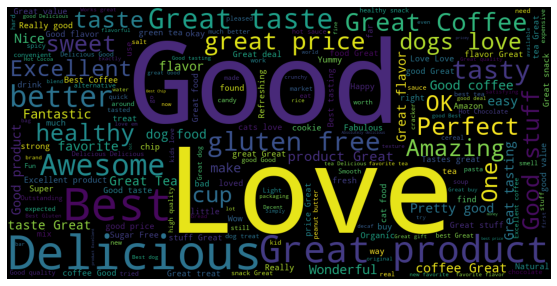

In [28]:
wordcloud=WordCloud(width=1000,height =500,stopwords=stopwords).generate(total_text)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis("off")

In [29]:
# negative sentiment data analysis 

In [30]:
total_text2 = " ".join(data_Negative["Summary"])
total_text2 = re.sub("[^a-zA-Z]"," ",total_text2)
total_text2 = re.sub( "  +"," ",total_text2)

In [31]:
total_text2[0:1000]

'Not as Advertised Strawberry Twizzlers Yummy Twizzlers Strawberry Nasty No flavor Don t like it You ll go nuts over Ass Kickin Peanuts stale product pretzel haven No Tea Flavor So convenient Bad It burns Rip off Price Very Low quality relaxing almost like something you smoke yum falafel CHANGED FORMULA MAKES CATS SICK Price cannot be correct Not a real tea Mcclures bloody Mary mix Furniture Polish Taste Taste is neutral quantity is DECEITFUL Disappointed Pok Chops Sad outcome Don t Waste Your Money Reeks like chemicals You ll never use white sugar again YUMMY Rocket in a Bottle So awful I can barely describe what quantity is it Penguin Pooper AWFUL Bitter Can t find anywhere else Disappointing Waste of money MSG Ham Base Awful disappointing Hard These chips make me weak at the knees fantastic you can not beat this taste and you can not resist to it only one if you are spice lover Not Very Creamy or Chivey Maybe the worst chips ever POTATO CHIPS Gone down hill Stale Rancid Oil Taste An

(-0.5, 999.5, 499.5, -0.5)

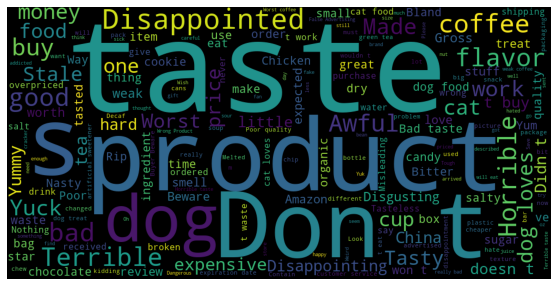

In [32]:
wordcloud=WordCloud(width=1000,height =500,stopwords=stopwords).generate(total_text2)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis("off")

In [33]:
# Analysing ,for What type of user amazon recommand new product

In [34]:
df.head()
# Task is to fatch all userid that are going to buy new produts

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [35]:
df["UserId"].nunique() # Gives total no of unique users
# now we need to group data on the basis on user id and compaere on the basis of their respective summary

256059

In [36]:
# (1) Grouping data by UserId
#(2) apply aggregate functions on Summary--count,Text -- count , Score -- mean , ProductId -- count
#(3)Sort by Text in desending order.
row = df.groupby("UserId").agg({"Summary":"count","Text":"count","Score":"mean","ProductId":"count"}).sort_values(by="Text",ascending=False)
row

,Summary,Text,Score,ProductId
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [37]:
row.columns = [ "number_of_summaries","number_of_text","Avg_Score","No_of_Product_Purchased"]
row

,number_of_summaries,number_of_text,Avg_Score,No_of_Product_Purchased
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [38]:

user_10 = row.index[0:10]

In [39]:
num_10 = row["No_of_Product_Purchased"][0:10]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

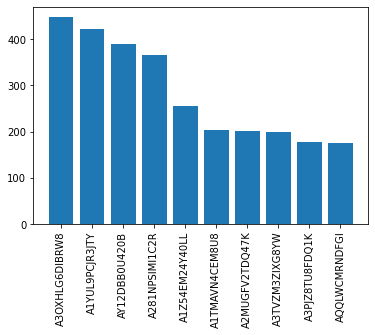

In [40]:
plt.bar(user_10,num_10,label="most recommanded users")
plt.xlabel = ("User_Id")
plt.ylabel = ("No_of_Product_Purchased")
plt.xticks(rotation = "vertical")

In [41]:
# Analyse Length of comments


In [42]:
# consider sample data
df.sample(n=2000)
final = df[0:2000]

In [43]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [44]:
final.isnull().sum() # checking missing values

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [45]:
# find duplicate values
final.duplicated().sum()

0

In [46]:
# length of  comment
final["Text"][0].split(" ")

['I',
 'have',
 'bought',
 'several',
 'of',
 'the',
 'Vitality',
 'canned',
 'dog',
 'food',
 'products',
 'and',
 'have',
 'found',
 'them',
 'all',
 'to',
 'be',
 'of',
 'good',
 'quality.',
 'The',
 'product',
 'looks',
 'more',
 'like',
 'a',
 'stew',
 'than',
 'a',
 'processed',
 'meat',
 'and',
 'it',
 'smells',
 'better.',
 'My',
 'Labrador',
 'is',
 'finicky',
 'and',
 'she',
 'appreciates',
 'this',
 'product',
 'better',
 'than',
 '',
 'most.']

In [47]:
len (final["Text"][0].split(" "))

49

In [48]:
# Write a function to calculate length of all the comments
def calc_len(text):
    return len(text.split(" "))

In [49]:
final["Text_length"] = final["Text"].apply(calc_len) # Apply function to a perticular column

<ipython-input-49-abfefe00a085>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["Text_length"] = final["Text"].apply(calc_len) # Apply function to a perticular column


In [50]:
! pip install plotly

In [51]:
import plotly.express as px

In [52]:
# To show Distribution
px.box(final,y="Text_length")

In [53]:
# Analysing the score


C:\Users\kesha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Score', ylabel='count'>

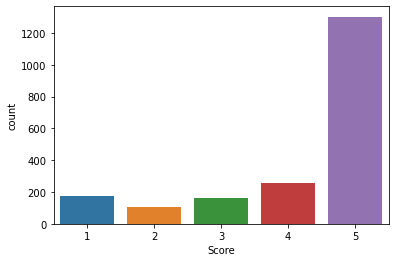

In [54]:
sns.countplot(final["Score"])

In [55]:
# Analyse the Behaviour of Customer
# It can be analyse on the basis of text colunm of that customer

In [56]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,30


In [57]:
final["Text"][0]# first text

'I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.'

In [58]:
# convert all text into lower case
final["Text"]=final["Text"].str.lower()

<ipython-input-58-6e63e2cb3610>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
final["Text"][164]

'seriously this product was as tasteless as they come. there are much better tasting products out there but at 100 calories its better than a special k bar or cookie snack pack. you just have to season it or combine it with something else to share the flavor.'

In [60]:
# remove the special charcter
# here we can't use subtitution function

In [61]:
special_char = '''!{}()[]<>?/\@#%&_'''

data = final["Text"][164]
no_punctuation=''

for char in data:
    if char not in special_char:
        no_punctuation=no_punctuation + char
no_punctuation
# eleminating the special charcter        

'seriously this product was as tasteless as they come. there are much better tasting products out there but at 100 calories its better than a special k bar or cookie snack pack. you just have to season it or combine it with something else to share the flavor.'

In [62]:
import string 
punctuations = string.punctuation

In [63]:
def remove_punc(review):
    no_punctuation=''

    for i in review:
        if i not in review:
            no_punctuation=no_punctuation + i
    return no_punctuation

In [64]:
final["Text"] 

0       i have bought several of the vitality canned d...
1       product arrived labeled as jumbo salted peanut...
2       this is a confection that has been around a fe...
3       if you are looking for the secret ingredient i...
4       great taffy at a great price.  there was a wid...
                              ...                        
1995    i have to laugh at the reviews that said it wa...
1996    i had read some favorable reviews of this panc...
1997    i was expecting great things based on the revi...
1998    i love this pancake mix.  i bought my first ca...
1999    what can i say??  they are wonderful, and the ...
Name: Text, Length: 2000, dtype: object

In [65]:
final

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price. there was a wid...,30
...,...,...,...,...,...,...,...,...,...,...,...
1995,1996,B001E5E29A,A3IJNH61DY5N9K,Sharon Allan,10,11,5,1265846400,Great Waffles for us non-cooks,i have to laugh at the reviews that said it wa...,94
1996,1997,B001E5E29A,A35W3JQYP0M655,"Ambergris ""John Thomas""",7,7,5,1279929600,Excellent Fluffy Pancakes.....,i had read some favorable reviews of this panc...,346
1997,1998,B001E5E29A,A3CLWZGMC7M9Z1,"Hippie2MARS ""Hippie2MARS""",6,6,4,1250640000,Good Basic Mix,i was expecting great things based on the revi...,52
1998,1999,B001E5E29A,A2V6P1FKRHCVQQ,S. Jackson,8,9,4,1265760000,"Good pancakes, lots of work",i love this pancake mix. i bought my first ca...,88


In [66]:
data = final["Text"][164]

'seriously this product was as tasteless as they come. there are much better tasting products out there but at 100 calories its better than a special k bar or cookie snack pack. you just have to season it or combine it with something else to share the flavor.'

In [ ]:
# removig stopwords

In [76]:
! pip install nltk


In [108]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kesha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [110]:
 # acess all data and remove stopwords
re = [word for word in data.split(" ") if word not in set(stopwords.words("english"))]

str=''
for wd in re:
    str=str+wd
    str=str+" "
str
  

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor. '

In [111]:
def remove_stopwords(review):
    return " ".join([word for word in data.split(" ") if word not in set(stopwords.words("english"))])
    

In [112]:
final["Text"]=final["Text"].apply(remove_stopwords)

<ipython-input-112-eec01d8c0159>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [113]:
final["Text"][45]

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [114]:
# check hyperlink and url in text section
final["Text"].str.contains("http?").sum()

0

In [115]:
pd.set_option("display.max_rows",2000) # TO show 2000 rows
final["Text"].str.contains("http?") #check substring 
# true == url or hyperlink

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [116]:
review =final["Text"][21]
review

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [117]:
import re

In [118]:
url_pattern = re.compile(r"href|http.\w+")
url_pattern.sub(r'',review)

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [119]:
def remove_urls(review):
    url_pattern = re.compile(r"href|http.\w+")
    return url_pattern.sub(r'',review)
    

In [120]:
final["Text"]=final["Text"].apply(remove_urls)

<ipython-input-120-e5f9527a54c8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [121]:
final["Text"][21]

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [122]:
final["Text"][25]

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [123]:
final["Text"].str.contains("http?").sum()

0

In [124]:
final["Text"][34]
# br is of no sense

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [125]:
# for single element
final["Text"][34].replace('br','')

'seriously product tasteless come. much better tasting products 100 calories better special k bar cookie snack pack. season combine something else share flavor.'

In [126]:
# for whole dataset
for i in range(len(final["Text"])):
    final["Text"][i].replace('br','')

In [127]:
# wordcloud representation

In [128]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,seriously product tasteless come. much better ...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,seriously product tasteless come. much better ...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",seriously product tasteless come. much better ...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,seriously product tasteless come. much better ...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,seriously product tasteless come. much better ...,30


In [129]:
comment_words = " ".join(final["Text"]) 

In [130]:
stopwords = set(STOPWORDS)

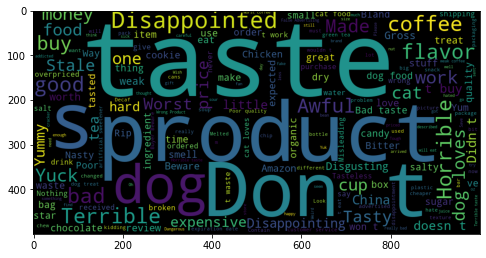

In [136]:
wordclord=WordCloud(width=800,height=800,stopwords=stopwords).generate(comment_words)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis=("off")